(125000,)
Train data: 125000 captions, 125000 images


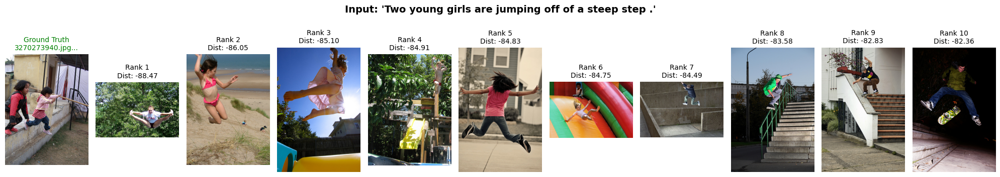

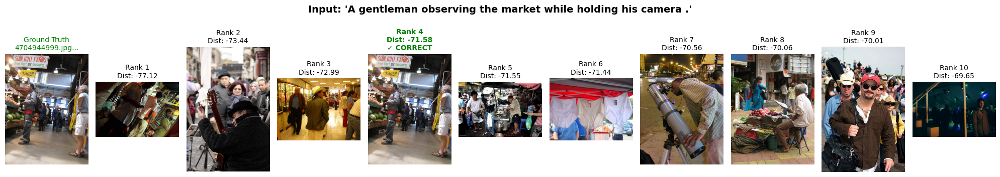

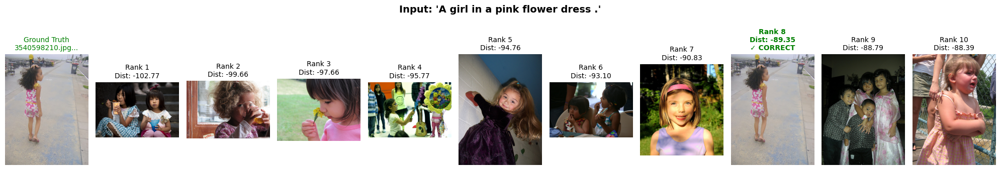

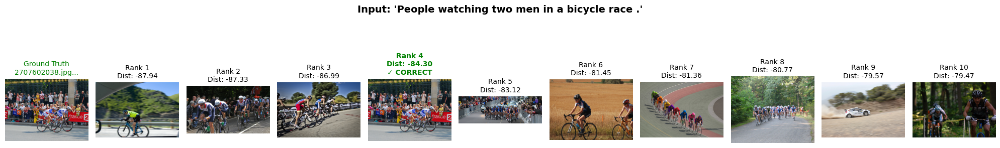

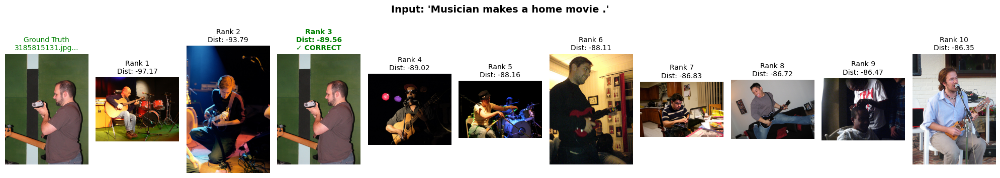

...

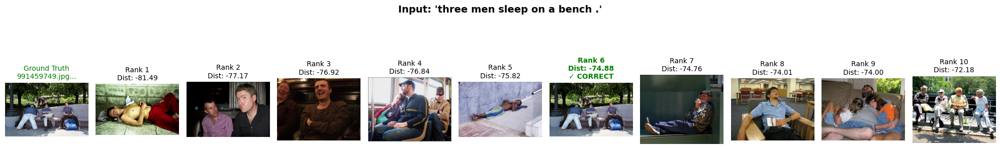

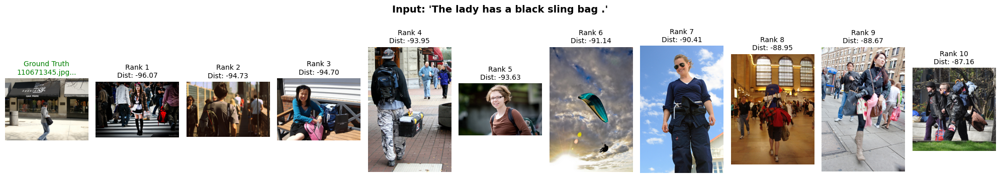

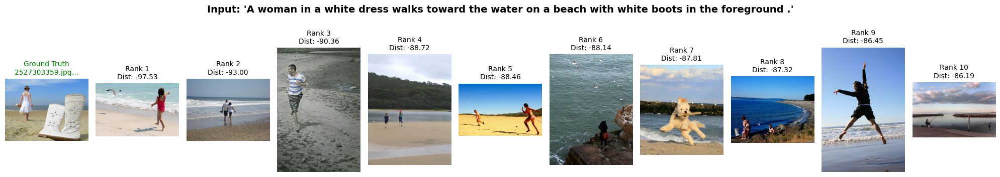

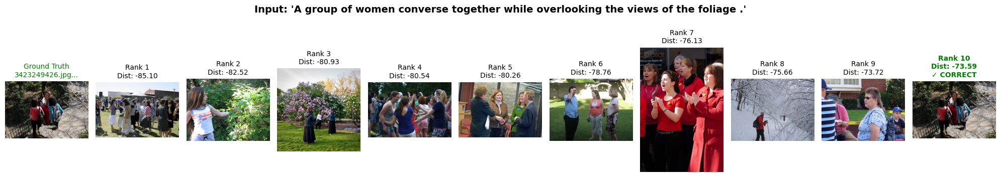

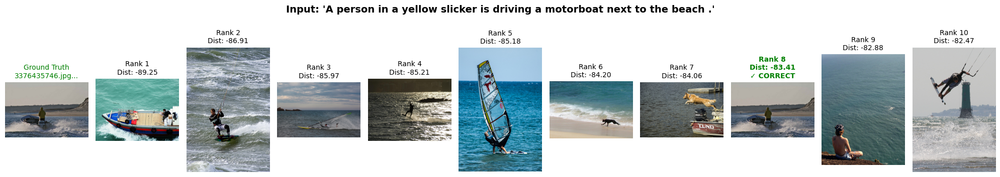

In [1]:
import numpy as np
import torch
from torch.utils.data import DataLoader, TensorDataset

from src.common import load_data, prepare_train_data
from src.eval import visualize_retrieval
from train_mrr import (
    MLP,
    MODEL_PATH,
    VAL_RATIO,
    RANDOM_SEED,
    DEVICE,
    MODEL_PATH_MRR,
    seed_everything,
)

# 1) Recreate the image-based validation split
seed_everything(RANDOM_SEED)

train_data = load_data("data/train/train.npz")
X, y, label = prepare_train_data(train_data)

caption_image_ids = torch.argmax(label.float(), dim=1).long()
num_images = label.shape[1]

g = torch.Generator().manual_seed(RANDOM_SEED)
permuted = torch.randperm(num_images, generator=g)
num_val_images = max(1, int(num_images * VAL_RATIO))
val_image_ids = permuted[-num_val_images:]
val_image_mask = torch.zeros(num_images, dtype=torch.bool)
val_image_mask[val_image_ids] = True

val_mask = val_image_mask[caption_image_ids]
val_text_embd = X[val_mask]
val_caption_ids = caption_image_ids[val_mask]

val_caption_text = train_data["captions/text"][val_mask.cpu().numpy()]
val_img_mask = val_image_mask.cpu().numpy()
val_img_names = train_data["images/names"][val_img_mask]
val_img_embd = torch.from_numpy(train_data["images/embeddings"][val_img_mask]).float()

# Map original image ids -> contiguous indices within the validation image pool
image_id_to_val_idx = {
    int(orig_id): idx for idx, orig_id in enumerate(torch.arange(num_images)[val_img_mask])
}
val_label = np.array([image_id_to_val_idx[int(img_id)] for img_id in val_caption_ids])

# 2) Run best baseline (train_mrr) checkpoint on all validation captions
model = MLP().to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH_MRR, map_location=DEVICE))
model.eval()

val_ds = TensorDataset(val_text_embd, val_caption_ids)
val_loader = DataLoader(val_ds, batch_size=512, shuffle=False)

pred_chunks = []
with torch.no_grad():
    for text_batch, _ in val_loader:
        pred_chunks.append(model(text_batch.to(DEVICE)).cpu())
val_preds = torch.cat(pred_chunks, dim=0)

# 3) Visualize a handful of random captions
num_samples = min(20, len(val_preds))
sample_indices = np.random.choice(len(val_preds), size=num_samples, replace=False)

for idx in sample_indices:
    caption_text = val_caption_text[idx]
    gt_index = val_label[idx]
    pred_embed = val_preds[idx].unsqueeze(0)  # visualize_retrieval expects [1, dim]

    visualize_retrieval(
        pred_embed,
        gt_index,
        val_img_names,
        caption_text,
        val_img_embd,
        k=10,
    )